In [2]:
import os
import pandas as pd
pd.set_option('display.max_rows',100)
pd.set_option('display.max_columns',200)
import matplotlib.pyplot as plt
import matplotlib.colors
from scipy.stats import pearsonr
import seaborn as sns
from scipy import stats
%matplotlib inline
sns.set()
import numpy as np
import pandas_profiling
import folium
import warnings
warnings.filterwarnings('ignore')

In [2]:
tb_estab = pd.read_csv('tbEstabelecimento201908.csv', sep = ';', header=0, encoding='utf-8')
tb_estab = tb_estab.add_suffix('_tbEstabelecimento')
tb_estab.shape

(387467, 54)

In [3]:
tb_TipoUnidade = pd.read_csv('tbTipoUnidade201908.csv', sep = ';', header=0,encoding='utf-8')
tb_TipoUnidade = tb_TipoUnidade.add_suffix('_tbTipoUnidade')
tb_TipoUnidade.shape

(39, 2)

In [4]:
tb_proj_pop = pd.read_csv('estimativa_TCU_2019_20190917.csv', sep = ';', header=0,encoding='utf-8')
tb_proj_pop = tb_proj_pop.add_suffix('_tbProjPopTCU')
tb_proj_pop.shape

(5570, 7)

In [5]:
tb_mun_latlong = pd.read_csv('municipios_lat_long.csv', sep = ',', header=0,encoding='utf-8')
tb_mun_latlong = tb_mun_latlong.add_suffix('_tbMunLatLong')
tb_mun_latlong = tb_mun_latlong[['codigo_ibge_tbMunLatLong','capital_tbMunLatLong','latitude_tbMunLatLong','longitude_tbMunLatLong']]
tb_mun_latlong.shape

(5570, 4)

In [6]:
tb_mun_latlong

,codigo_ibge_tbMunLatLong,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong
0,5200050,0,-16.757300,-49.4412
1,3100104,0,-18.483100,-47.3916
2,5200100,0,-16.197000,-48.7057
3,3100203,0,-19.155100,-45.4444
4,1500107,0,-1.721830,-48.8788
5,2300101,0,-7.345880,-39.0416
6,2900108,0,-13.248800,-41.6619
7,2900207,0,-8.720730,-39.1162
8,4100103,0,-23.304900,-50.3133
9,4200051,0,-27.612600,-51.0233


In [7]:
tb_proj_pop

,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU
0,RO,11,15,1100015,110001,Alta Floresta D'Oeste,22945
1,RO,11,23,1100023,110002,Ariquemes,107863
2,RO,11,31,1100031,110003,Cabixi,5312
3,RO,11,49,1100049,110004,Cacoal,85359
4,RO,11,56,1100056,110005,Cerejeiras,16323
5,RO,11,64,1100064,110006,Colorado do Oeste,15882
6,RO,11,72,1100072,110007,Corumbiara,7391
7,RO,11,80,1100080,110008,Costa Marques,18331
8,RO,11,98,1100098,110009,Espigão D'Oeste,32374
9,RO,11,106,1100106,110010,Guajará-Mirim,46174


In [8]:
tb_estabcomp = pd.read_csv('rlEstabComplementar201908.csv', sep = ';', header=0, encoding='latin-1')
tb_estabcomp = tb_estabcomp.add_suffix('_rlEstabComplementar')
tb_estabcomp.shape

(55096, 10)

In [9]:
tb_estabcomp = tb_estabcomp.groupby(['CO_UNIDADE_rlEstabComplementar'])['QT_EXIST_rlEstabComplementar'].sum().reset_index()
tb_estabcomp.rename({'QT_EXIST_rlEstabComplementar': 'QT_EXIST_LEITOS_rlEstabComplementar'}, axis=1, inplace=True)
tb_estabcomp

,CO_UNIDADE_rlEstabComplementar,QT_EXIST_LEITOS_rlEstabComplementar
0,1100012516500,6
1,1100012679477,45
2,1100022494280,36
3,1100022494299,67
4,1100022515504,22
5,1100022515520,3
6,1100022515555,43
7,1100022515598,49
8,1100022515601,23
9,1100025082145,15


In [10]:
tb_estab = pd.merge(tb_estab, tb_TipoUnidade, left_on="TP_UNIDADE_tbEstabelecimento", right_on="CO_TIPO_UNIDADE_tbTipoUnidade", how='inner')
tb_estab = tb_estab.drop(['CO_TIPO_UNIDADE_tbTipoUnidade'], axis=1)
tb_estab.shape

(387467, 55)

In [11]:
tb_estab = pd.merge(tb_estab, tb_estabcomp, left_on="CO_UNIDADE_tbEstabelecimento", right_on="CO_UNIDADE_rlEstabComplementar", how='left')
tb_estab = tb_estab.drop(['CO_UNIDADE_rlEstabComplementar'], axis=1)
tb_estab['QT_EXIST_LEITOS_rlEstabComplementar'].fillna(0, inplace=True)
tb_estab.shape

(387467, 56)

In [12]:
tb_estab = tb_estab[['CO_UNIDADE_tbEstabelecimento','CO_CNES_tbEstabelecimento','DS_TIPO_UNIDADE_tbTipoUnidade','CO_MUNICIPIO_GESTOR_tbEstabelecimento','QT_EXIST_LEITOS_rlEstabComplementar']]

In [13]:
tb_estab

,CO_UNIDADE_tbEstabelecimento,CO_CNES_tbEstabelecimento,DS_TIPO_UNIDADE_tbTipoUnidade,CO_MUNICIPIO_GESTOR_tbEstabelecimento,QT_EXIST_LEITOS_rlEstabComplementar
0,3111106673937,6673937,CENTRO DE SAUDE/UNIDADE BASICA,311110,0.0
1,3530607781717,7781717,CENTRO DE SAUDE/UNIDADE BASICA,353060,0.0
2,2312909205098,9205098,CENTRO DE SAUDE/UNIDADE BASICA,231290,0.0
3,4314907794541,7794541,CENTRO DE SAUDE/UNIDADE BASICA,431490,0.0
4,3151809061878,9061878,CENTRO DE SAUDE/UNIDADE BASICA,315180,0.0
5,2311707902123,7902123,CENTRO DE SAUDE/UNIDADE BASICA,231170,0.0
6,3143307780885,7780885,CENTRO DE SAUDE/UNIDADE BASICA,314330,0.0
7,5005009047662,9047662,CENTRO DE SAUDE/UNIDADE BASICA,500500,0.0
8,2903909109587,9109587,CENTRO DE SAUDE/UNIDADE BASICA,290390,0.0
9,5103359102701,9102701,CENTRO DE SAUDE/UNIDADE BASICA,510335,0.0


In [14]:
((tb_estab.isnull() | tb_estab.isna()).sum() * 100 / tb_estab.index.size).round(2)

CO_UNIDADE_tbEstabelecimento             0.0
CO_CNES_tbEstabelecimento                0.0
DS_TIPO_UNIDADE_tbTipoUnidade            0.0
CO_MUNICIPIO_GESTOR_tbEstabelecimento    0.0
QT_EXIST_LEITOS_rlEstabComplementar      0.0
dtype: float64

In [15]:
tb_estab_crosstab = pd.crosstab(tb_estab.CO_MUNICIPIO_GESTOR_tbEstabelecimento, tb_estab.DS_TIPO_UNIDADE_tbTipoUnidade)
colunas = tb_estab_crosstab.columns
colunas.tolist()
ind = pd.Index([e for e in colunas.tolist()])
tb_estab_crosstab.columns = ind
tb_estab_crosstab = tb_estab_crosstab.reset_index()
tb_estab_crosstab.columns = ['CO_MUNICIPIO_GESTOR_tbEstabelecimento', 'CENTRAL_DE_ABASTECIMENTO', 'CENTRAL_DE_GESTAO_EM_SAUDE', 'CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL', 'CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE', 'CENTRAL_DE_REGULACAO_DO_ACESSO', 'CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS', 'CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA', 'CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA', 'CENTRO_DE_ATENCAO_PSICOSSOCIAL', 'CENTRO_DE_IMUNIZACAO', 'CENTRO_DE_PARTO_NORMAL_-_ISOLADO', 'CENTRO_DE_SAUDE_UNIDADE_BASICA', 'CLINICA_CENTRO_DE_ESPECIALIDADE', 'CONSULTORIO_ISOLADO', 'COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE', 'FARMACIA', 'HOSPITAL_ESPECIALIZADO', 'HOSPITAL_GERAL', 'HOSPITAL_DIA_-_ISOLADO', 'LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN', 'LABORATORIO_DE_SAUDE_PUBLICA', 'OFICINA_ORTOPEDICA', 'POLICLINICA', 'POLO_ACADEMIA_DA_SAUDE', 'POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE', 'POSTO_DE_SAUDE', 'PRONTO_ATENDIMENTO', 'PRONTO_SOCORRO_ESPECIALIZADO', 'PRONTO_SOCORRO_GERAL', 'SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE', 'TELESSAUDE', 'UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO', 'UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA', 'UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL', 'UNIDADE_DE_VIGILANCIA_EM_SAUDE', 'UNIDADE_MISTA', 'UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA', 'UNIDADE_MOVEL_FLUVIAL', 'UNIDADE_MOVEL_TERRESTRE']
tb_estab_crosstab

,CO_MUNICIPIO_GESTOR_tbEstabelecimento,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE
0,110001,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0
1,110002,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0
2,110003,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0
3,110004,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2
4,110005,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0
5,110006,0,1,0,0,0,0,0,0,1,0,0,4,2,6,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,1,0,0,0,0
6,110007,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0
7,110008,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,4,0,0,1,1,0,0,0
8,110009,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0
9,110010,0,1,0,0,0,0,0,1,1,0,0,7,0,15,0,0,0,2,0,1,0,0,0,0,1,12,0,0,0,0,0,9,5,0,2,0,0,0,3


In [17]:
tb_mun_qt_leitos = tb_estab.groupby(['CO_MUNICIPIO_GESTOR_tbEstabelecimento'])['QT_EXIST_LEITOS_rlEstabComplementar'].sum().reset_index()
tb_mun_qt_leitos.columns = ['CO_MUNICIPIO_GESTOR_tbEstabelecimento_1', 'QT_EXIST_LEITOS_rlEstabComplementar']
tb_mun_qt_leitos.sort_values('QT_EXIST_LEITOS_rlEstabComplementar')

,CO_MUNICIPIO_GESTOR_tbEstabelecimento_1,QT_EXIST_LEITOS_rlEstabComplementar
2791,314675,0.0
2936,315940,0.0
2937,315950,0.0
2939,315970,0.0
2942,316000,0.0
2943,316010,0.0
2944,316020,0.0
2947,316045,0.0
2948,316050,0.0
2949,316060,0.0


In [18]:
tb_mun_sem_leitos = tb_mun_qt_leitos.loc[tb_mun_qt_leitos['QT_EXIST_LEITOS_rlEstabComplementar'] == 0.0]
tb_mun_sem_leitos

,CO_MUNICIPIO_GESTOR_tbEstabelecimento_1,QT_EXIST_LEITOS_rlEstabComplementar
43,110147,0.0
55,120013,0.0
56,120017,0.0
58,120025,0.0
73,120080,0.0
92,130115,0.0
136,140002,0.0
140,140017,0.0
150,140070,0.0
173,150160,0.0


In [19]:
tb_mun_unidades_basicas = tb_estab['CO_MUNICIPIO_GESTOR_tbEstabelecimento'].value_counts().reset_index()
tb_mun_unidades_basicas.columns = ['CO_MUNICIPIO_GESTOR_tbEstabelecimento_2', 'QT_UNIDADES_BASICAS']
tb_mun_unidades_basicas.sort_values('QT_UNIDADES_BASICAS')

,CO_MUNICIPIO_GESTOR_tbEstabelecimento_2,QT_UNIDADES_BASICAS
5583,172093,1
5582,530150,1
5580,431087,2
5554,430843,2
5553,353040,2
5552,432252,2
5551,530020,2
5550,522028,2
5549,430655,2
5548,354720,2


In [20]:
teste = pd.merge(tb_estab_crosstab, tb_mun_sem_leitos, left_on="CO_MUNICIPIO_GESTOR_tbEstabelecimento", right_on="CO_MUNICIPIO_GESTOR_tbEstabelecimento_1", how='inner')
teste = teste.drop(['CO_MUNICIPIO_GESTOR_tbEstabelecimento_1'], axis=1)
teste

,CO_MUNICIPIO_GESTOR_tbEstabelecimento,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_EXIST_LEITOS_rlEstabComplementar
0,110147,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0
1,120013,0,1,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0.0
2,120017,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,1,0,1,0,1,0.0
3,120025,0,1,0,0,0,0,0,0,1,0,0,7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,0.0
4,120080,0,1,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,1,0,1,0,2,0.0
5,130115,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,17,0,0,0,0,0,0,0,0,0,0,0,1,0,0.0
6,140002,0,1,0,0,0,0,0,0,1,0,0,6,0,0,0,0,0,0,0,0,0,0,0,1,0,6,0,0,0,0,0,0,29,0,2,0,1,0,1,0.0
7,140017,0,1,0,0,0,0,0,0,1,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0,0,17,0,0,0,0,0,0,6,0,2,0,1,0,1,0.0
8,140070,0,1,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,0,0,1,1,0,0,0,0,4,0,0,0,0,0,0,77,0,2,0,1,0,0,0.0
9,150160,0,1,0,0,1,0,1,0,0,0,0,1,3,0,0,1,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,2,0,0,1,0,0,0,0,0.0


In [21]:
merge1 = pd.merge(tb_proj_pop, tb_mun_latlong, left_on="COD_MUNIC7_tbProjPopTCU", right_on="codigo_ibge_tbMunLatLong", how='inner')
merge1 = merge1.drop(['codigo_ibge_tbMunLatLong'], axis=1)
merge1

,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong
0,RO,11,15,1100015,110001,Alta Floresta D'Oeste,22945,0,-11.92830,-61.9953
1,RO,11,23,1100023,110002,Ariquemes,107863,0,-9.90571,-63.0325
2,RO,11,31,1100031,110003,Cabixi,5312,0,-13.49450,-60.5520
3,RO,11,49,1100049,110004,Cacoal,85359,0,-11.43430,-61.4562
4,RO,11,56,1100056,110005,Cerejeiras,16323,0,-13.18700,-60.8168
5,RO,11,64,1100064,110006,Colorado do Oeste,15882,0,-13.11740,-60.5454
6,RO,11,72,1100072,110007,Corumbiara,7391,0,-12.95510,-60.8947
7,RO,11,80,1100080,110008,Costa Marques,18331,0,-12.43670,-64.2280
8,RO,11,98,1100098,110009,Espigão D'Oeste,32374,0,-11.52660,-61.0252
9,RO,11,106,1100106,110010,Guajará-Mirim,46174,0,-10.78890,-65.3296


In [22]:
merge2 = pd.merge(merge1, tb_estab_crosstab, left_on="COD_MUNIC6_tbProjPopTCU", right_on="CO_MUNICIPIO_GESTOR_tbEstabelecimento", how='inner')
merge2 = merge2.drop(['CO_MUNICIPIO_GESTOR_tbEstabelecimento'], axis=1)
merge2

,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE
0,RO,11,15,1100015,110001,Alta Floresta D'Oeste,22945,0,-11.92830,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0
1,RO,11,23,1100023,110002,Ariquemes,107863,0,-9.90571,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0
2,RO,11,31,1100031,110003,Cabixi,5312,0,-13.49450,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0
3,RO,11,49,1100049,110004,Cacoal,85359,0,-11.43430,-61.4562,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2
4,RO,11,56,1100056,110005,Cerejeiras,16323,0,-13.18700,-60.8168,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0
5,RO,11,64,1100064,110006,Colorado do Oeste,15882,0,-13.11740,-60.5454,0,1,0,0,0,0,0,0,1,0,0,4,2,6,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,1,0,0,0,0
6,RO,11,72,1100072,110007,Corumbiara,7391,0,-12.95510,-60.8947,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0
7,RO,11,80,1100080,110008,Costa Marques,18331,0,-12.43670,-64.2280,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,4,0,0,1,1,0,0,0
8,RO,11,98,1100098,110009,Espigão D'Oeste,32374,0,-11.52660,-61.0252,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0
9,RO,11,106,1100106,110010,Guajará-Mirim,46174,0,-10.78890,-65.3296,0,1,0,0,0,0,0,1,1,0,0,7,0,15,0,0,0,2,0,1,0,0,0,0,1,12,0,0,0,0,0,9,5,0,2,0,0,0,3


In [23]:
merge3 = pd.merge(merge2, tb_mun_unidades_basicas, left_on="COD_MUNIC6_tbProjPopTCU", right_on="CO_MUNICIPIO_GESTOR_tbEstabelecimento_2", how='inner')
merge3 = merge3.drop(['CO_MUNICIPIO_GESTOR_tbEstabelecimento_2'], axis=1)
merge3

,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS
0,RO,11,15,1100015,110001,Alta Floresta D'Oeste,22945,0,-11.92830,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0,38
1,RO,11,23,1100023,110002,Ariquemes,107863,0,-9.90571,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0,145
2,RO,11,31,1100031,110003,Cabixi,5312,0,-13.49450,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0,18
3,RO,11,49,1100049,110004,Cacoal,85359,0,-11.43430,-61.4562,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2,362
4,RO,11,56,1100056,110005,Cerejeiras,16323,0,-13.18700,-60.8168,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0,34
5,RO,11,64,1100064,110006,Colorado do Oeste,15882,0,-13.11740,-60.5454,0,1,0,0,0,0,0,0,1,0,0,4,2,6,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,1,0,0,0,0,22
6,RO,11,72,1100072,110007,Corumbiara,7391,0,-12.95510,-60.8947,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0,13
7,RO,11,80,1100080,110008,Costa Marques,18331,0,-12.43670,-64.2280,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,4,0,0,1,1,0,0,0,15
8,RO,11,98,1100098,110009,Espigão D'Oeste,32374,0,-11.52660,-61.0252,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0,49
9,RO,11,106,1100106,110010,Guajará-Mirim,46174,0,-10.78890,-65.3296,0,1,0,0,0,0,0,1,1,0,0,7,0,15,0,0,0,2,0,1,0,0,0,0,1,12,0,0,0,0,0,9,5,0,2,0,0,0,3,60


In [24]:
merge4 = pd.merge(merge3, tb_mun_qt_leitos, left_on="COD_MUNIC6_tbProjPopTCU", right_on="CO_MUNICIPIO_GESTOR_tbEstabelecimento_1", how='inner')
merge4 = merge4.drop(['CO_MUNICIPIO_GESTOR_tbEstabelecimento_1'], axis=1)
merge4

,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
0,RO,11,15,1100015,110001,Alta Floresta D'Oeste,22945,0,-11.92830,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0,38,51.0
1,RO,11,23,1100023,110002,Ariquemes,107863,0,-9.90571,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0,145,317.0
2,RO,11,31,1100031,110003,Cabixi,5312,0,-13.49450,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0,18,9.0
3,RO,11,49,1100049,110004,Cacoal,85359,0,-11.43430,-61.4562,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2,362,469.0
4,RO,11,56,1100056,110005,Cerejeiras,16323,0,-13.18700,-60.8168,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0,34,42.0
5,RO,11,64,1100064,110006,Colorado do Oeste,15882,0,-13.11740,-60.5454,0,1,0,0,0,0,0,0,1,0,0,4,2,6,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,1,0,0,0,0,22,50.0
6,RO,11,72,1100072,110007,Corumbiara,7391,0,-12.95510,-60.8947,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0,13,16.0
7,RO,11,80,1100080,110008,Costa Marques,18331,0,-12.43670,-64.2280,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,4,0,0,1,1,0,0,0,15,45.0
8,RO,11,98,1100098,110009,Espigão D'Oeste,32374,0,-11.52660,-61.0252,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0,49,55.0
9,RO,11,106,1100106,110010,Guajará-Mirim,46174,0,-10.78890,-65.3296,0,1,0,0,0,0,0,1,1,0,0,7,0,15,0,0,0,2,0,1,0,0,0,0,1,12,0,0,0,0,0,9,5,0,2,0,0,0,3,60,97.0


In [25]:
teste_filtro = merge4.loc[merge4['QT_EXIST_LEITOS_rlEstabComplementar'] == 0.0]
teste_filtro

,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
43,RO,11,1476,1101476,110147,Primavera de Rondônia,2856,0,-11.829500,-61.3153,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0.0
55,AC,12,138,1200138,120013,Bujari,10266,0,-9.815280,-67.9550,0,1,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,9,0.0
56,AC,12,179,1200179,120017,Capixaba,11733,0,-10.566000,-67.6860,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,1,0,1,0,1,10,0.0
58,AC,12,252,1200252,120025,Epitaciolândia,18411,0,-11.018800,-68.7341,0,1,0,0,0,0,0,0,1,0,0,7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,12,0.0
73,AC,12,807,1200807,120080,Porto Acre,18504,0,-9.581380,-67.5478,0,1,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,1,0,1,0,2,13,0.0
92,AM,13,1159,1301159,130115,Careiro da Várzea,30225,0,-3.314000,-59.5557,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,17,0,0,0,0,0,0,0,0,0,0,0,1,0,21,0.0
136,RR,14,27,1400027,140002,Amajari,12796,0,3.645710,-61.3692,0,1,0,0,0,0,0,0,1,0,0,6,0,0,0,0,0,0,0,0,0,0,0,1,0,6,0,0,0,0,0,0,29,0,2,0,1,0,1,48,0.0
140,RR,14,175,1400175,140017,Cantá,18335,0,2.609940,-60.6058,0,1,0,0,0,0,0,0,1,0,0,6,0,0,0,0,0,0,0,0,0,0,0,0,0,17,0,0,0,0,0,0,6,0,2,0,1,0,1,35,0.0
150,RR,14,704,1400704,140070,Uiramutã,10559,0,4.603140,-60.1815,0,1,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,0,0,1,1,0,0,0,0,4,0,0,0,0,0,0,77,0,2,0,1,0,0,93,0.0
173,PA,15,1600,1501600,150160,Bonito,16286,0,-1.367450,-47.3066,0,1,0,0,1,0,1,0,0,0,0,1,3,0,0,1,0,0,0,0,0,0,0,0,0,6,0,0,0,0,0,2,0,0,1,0,0,0,0,17,0.0


In [155]:
merge4.to_csv(r'base_tcc_Bruno.csv', index = None, header=True, sep=';', encoding='utf-8')

In [14]:
base_v1 = pd.read_csv('base_tcc_Bruno.csv', sep = ';', header=0, encoding='utf-8')
base_v1

,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
0,RO,11,15,1100015,110001,Alta Floresta D'Oeste,22945,0,-11.92830,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0,38,51.0
1,RO,11,23,1100023,110002,Ariquemes,107863,0,-9.90571,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0,145,317.0
2,RO,11,31,1100031,110003,Cabixi,5312,0,-13.49450,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0,18,9.0
3,RO,11,49,1100049,110004,Cacoal,85359,0,-11.43430,-61.4562,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2,362,469.0
4,RO,11,56,1100056,110005,Cerejeiras,16323,0,-13.18700,-60.8168,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0,34,42.0
5,RO,11,64,1100064,110006,Colorado do Oeste,15882,0,-13.11740,-60.5454,0,1,0,0,0,0,0,0,1,0,0,4,2,6,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,1,0,0,0,0,22,50.0
6,RO,11,72,1100072,110007,Corumbiara,7391,0,-12.95510,-60.8947,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0,13,16.0
7,RO,11,80,1100080,110008,Costa Marques,18331,0,-12.43670,-64.2280,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,4,0,0,1,1,0,0,0,15,45.0
8,RO,11,98,1100098,110009,Espigão D'Oeste,32374,0,-11.52660,-61.0252,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0,49,55.0
9,RO,11,106,1100106,110010,Guajará-Mirim,46174,0,-10.78890,-65.3296,0,1,0,0,0,0,0,1,1,0,0,7,0,15,0,0,0,2,0,1,0,0,0,0,1,12,0,0,0,0,0,9,5,0,2,0,0,0,3,60,97.0


In [6]:
tb_area_mun = pd.read_csv('AR_BR_RG_UF_MES_MIC_MUN_2018.csv', sep = ';', header=0, encoding='utf-8')
tb_area_mun

,ID,CD_GCUF,NM_UF,NM_UF_SIGLA,CD_GCMUN,NM_MUN_2018,AR_MUN_2018
0,1,11,Rondônia,RO,1100015,ALTA FLORESTA D'OESTE,7067.025
1,2,11,Rondônia,RO,1100023,ARIQUEMES,4426.571
2,3,11,Rondônia,RO,1100031,CABIXI,1314.352
3,4,11,Rondônia,RO,1100049,CACOAL,3792.892
4,5,11,Rondônia,RO,1100056,CEREJEIRAS,2783.300
5,6,11,Rondônia,RO,1100064,COLORADO DO OESTE,1451.060
6,7,11,Rondônia,RO,1100072,CORUMBIARA,3060.321
7,8,11,Rondônia,RO,1100080,COSTA MARQUES,4987.177
8,16,11,Rondônia,RO,1100189,PIMENTA BUENO,6240.940
9,17,11,Rondônia,RO,1100205,PORTO VELHO,34090.954


In [7]:
tb_area_mun = tb_area_mun[['CD_GCMUN','AR_MUN_2018']]
tb_area_mun

,CD_GCMUN,AR_MUN_2018
0,1100015,7067.025
1,1100023,4426.571
2,1100031,1314.352
3,1100049,3792.892
4,1100056,2783.300
5,1100064,1451.060
6,1100072,3060.321
7,1100080,4987.177
8,1100189,6240.940
9,1100205,34090.954


In [15]:
base_v2 = pd.merge(base_v1, tb_area_mun, left_on="COD_MUNIC7_tbProjPopTCU", right_on="CD_GCMUN", how='inner')
base_v2 = base_v2.drop(['CD_GCMUN'], axis=1)
base_v2

,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar,AR_MUN_2018
0,RO,11,15,1100015,110001,Alta Floresta D'Oeste,22945,0,-11.92830,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0,38,51.0,7067.025
1,RO,11,23,1100023,110002,Ariquemes,107863,0,-9.90571,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0,145,317.0,4426.571
2,RO,11,31,1100031,110003,Cabixi,5312,0,-13.49450,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0,18,9.0,1314.352
3,RO,11,49,1100049,110004,Cacoal,85359,0,-11.43430,-61.4562,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2,362,469.0,3792.892
4,RO,11,56,1100056,110005,Cerejeiras,16323,0,-13.18700,-60.8168,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0,34,42.0,2783.300
5,RO,11,64,1100064,110006,Colorado do Oeste,15882,0,-13.11740,-60.5454,0,1,0,0,0,0,0,0,1,0,0,4,2,6,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,1,0,0,0,0,22,50.0,1451.060
6,RO,11,72,1100072,110007,Corumbiara,7391,0,-12.95510,-60.8947,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0,13,16.0,3060.321
7,RO,11,80,1100080,110008,Costa Marques,18331,0,-12.43670,-64.2280,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,4,0,0,1,1,0,0,0,15,45.0,4987.177
8,RO,11,98,1100098,110009,Espigão D'Oeste,32374,0,-11.52660,-61.0252,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0,49,55.0,4518.027
9,RO,11,106,1100106,110010,Guajará-Mirim,46174,0,-10.78890,-65.3296,0,1,0,0,0,0,0,1,1,0,0,7,0,15,0,0,0,2,0,1,0,0,0,0,1,12,0,0,0,0,0,9,5,0,2,0,0,0,3,60,97.0,24855.724


In [16]:
base_v2['DENSIDADE_POP'] = base_v2['POPULACAO_ESTIMADA _tbProjPopTCU']/base_v2['AR_MUN_2018']
base_v2['COD_REG'] = base_v2.COD_UF_tbProjPopTCU.astype(str).str[:1].astype(int)
base_v2['NM_REG'] = base_v2['COD_REG']
base_v2

,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar,AR_MUN_2018,DENSIDADE_POP,COD_REG,NM_REG
0,RO,11,15,1100015,110001,Alta Floresta D'Oeste,22945,0,-11.92830,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0,38,51.0,7067.025,3.246769,1,1
1,RO,11,23,1100023,110002,Ariquemes,107863,0,-9.90571,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0,145,317.0,4426.571,24.367168,1,1
2,RO,11,31,1100031,110003,Cabixi,5312,0,-13.49450,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0,18,9.0,1314.352,4.041535,1,1
3,RO,11,49,1100049,110004,Cacoal,85359,0,-11.43430,-61.4562,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2,362,469.0,3792.892,22.504991,1,1
4,RO,11,56,1100056,110005,Cerejeiras,16323,0,-13.18700,-60.8168,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0,34,42.0,2783.300,5.864621,1,1
5,RO,11,64,1100064,110006,Colorado do Oeste,15882,0,-13.11740,-60.5454,0,1,0,0,0,0,0,0,1,0,0,4,2,6,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,1,0,0,0,0,22,50.0,1451.060,10.945102,1,1
6,RO,11,72,1100072,110007,Corumbiara,7391,0,-12.95510,-60.8947,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0,13,16.0,3060.321,2.415106,1,1
7,RO,11,80,1100080,110008,Costa Marques,18331,0,-12.43670,-64.2280,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,4,0,0,1,1,0,0,0,15,45.0,4987.177,3.675627,1,1
8,RO,11,98,1100098,110009,Espigão D'Oeste,32374,0,-11.52660,-61.0252,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0,49,55.0,4518.027,7.165517,1,1
9,RO,11,106,1100106,110010,Guajará-Mirim,46174,0,-10.78890,-65.3296,0,1,0,0,0,0,0,1,1,0,0,7,0,15,0,0,0,2,0,1,0,0,0,0,1,12,0,0,0,0,0,9,5,0,2,0,0,0,3,60,97.0,24855.724,1.857681,1,1


In [18]:
base_v2 = base_v2[['COD_REG','NM_REG','UF_tbProjPopTCU','COD_UF_tbProjPopTCU','COD_MUNIC_tbProjPopTCU','COD_MUNIC7_tbProjPopTCU',\
                  'COD_MUNIC6_tbProjPopTCU','NOME_MUNICIPIO_tbProjPopTCU','POPULACAO_ESTIMADA _tbProjPopTCU',\
                  'AR_MUN_2018','DENSIDADE_POP','capital_tbMunLatLong','latitude_tbMunLatLong','longitude_tbMunLatLong',\
                  'CENTRAL_DE_ABASTECIMENTO','CENTRAL_DE_GESTAO_EM_SAUDE','CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL',\
                  'CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE','CENTRAL_DE_REGULACAO_DO_ACESSO','CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS',\
                  'CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA','CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA','CENTRO_DE_ATENCAO_PSICOSSOCIAL',\
                  'CENTRO_DE_IMUNIZACAO','CENTRO_DE_PARTO_NORMAL_-_ISOLADO','CENTRO_DE_SAUDE_UNIDADE_BASICA','CLINICA_CENTRO_DE_ESPECIALIDADE',\
                  'CONSULTORIO_ISOLADO','COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE','FARMACIA','HOSPITAL_ESPECIALIZADO',\
                  'HOSPITAL_GERAL','HOSPITAL_DIA_-_ISOLADO','LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN','LABORATORIO_DE_SAUDE_PUBLICA',\
                  'OFICINA_ORTOPEDICA','POLICLINICA','POLO_ACADEMIA_DA_SAUDE','POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE',\
                  'POSTO_DE_SAUDE','PRONTO_ATENDIMENTO','PRONTO_SOCORRO_ESPECIALIZADO','PRONTO_SOCORRO_GERAL',\
                  'SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE','TELESSAUDE','UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO',\
                  'UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA','UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL','UNIDADE_DE_VIGILANCIA_EM_SAUDE',\
                  'UNIDADE_MISTA','UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA','UNIDADE_MOVEL_FLUVIAL','UNIDADE_MOVEL_TERRESTRE',\
                  'QT_UNIDADES_BASICAS','QT_EXIST_LEITOS_rlEstabComplementar']]

In [24]:
base_v2['NM_REG'].replace(to_replace=[1],value='NORTE',inplace=True)
base_v2['NM_REG'].replace(to_replace=[2],value='NORDESTE',inplace=True)
base_v2['NM_REG'].replace(to_replace=[3],value='SUDESTE',inplace=True)
base_v2['NM_REG'].replace(to_replace=[4],value='SUL',inplace=True)
base_v2['NM_REG'].replace(to_replace=[5],value='CENTRO-OESTE',inplace=True)

In [26]:
base_v2.rename({'AR_MUN_2018': 'AREA_MUN'}, axis=1, inplace=True)

In [51]:
base_v2

,COD_REG,NM_REG,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,AREA_MUN,DENSIDADE_POP,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
0,1,NORTE,RO,11,15,1100015,110001,Alta Floresta D'Oeste,22945,7067.025,3.246769,0,-11.92830,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0,38,51.0
1,1,NORTE,RO,11,23,1100023,110002,Ariquemes,107863,4426.571,24.367168,0,-9.90571,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0,145,317.0
2,1,NORTE,RO,11,31,1100031,110003,Cabixi,5312,1314.352,4.041535,0,-13.49450,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0,18,9.0
3,1,NORTE,RO,11,49,1100049,110004,Cacoal,85359,3792.892,22.504991,0,-11.43430,-61.4562,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2,362,469.0
4,1,NORTE,RO,11,56,1100056,110005,Cerejeiras,16323,2783.300,5.864621,0,-13.18700,-60.8168,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0,34,42.0
5,1,NORTE,RO,11,64,1100064,110006,Colorado do Oeste,15882,1451.060,10.945102,0,-13.11740,-60.5454,0,1,0,0,0,0,0,0,1,0,0,4,2,6,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,1,0,0,0,0,22,50.0
6,1,NORTE,RO,11,72,1100072,110007,Corumbiara,7391,3060.321,2.415106,0,-12.95510,-60.8947,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0,13,16.0
7,1,NORTE,RO,11,80,1100080,110008,Costa Marques,18331,4987.177,3.675627,0,-12.43670,-64.2280,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,4,0,0,1,1,0,0,0,15,45.0
8,1,NORTE,RO,11,98,1100098,110009,Espigão D'Oeste,32374,4518.027,7.165517,0,-11.52660,-61.0252,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0,49,55.0
9,1,NORTE,RO,11,106,1100106,110010,Guajará-Mirim,46174,24855.724,1.857681,0,-10.78890,-65.3296,0,1,0,0,0,0,0,1,1,0,0,7,0,15,0,0,0,2,0,1,0,0,0,0,1,12,0,0,0,0,0,9,5,0,2,0,0,0,3,60,97.0


In [29]:
base_v2.to_csv(r'base_tcc_Bruno_v2.csv', index = None, header=True, sep=';', encoding='utf-8')

In [3]:
base_v2 = pd.read_csv('base_tcc_Bruno_v2.csv', sep = ';', header=0, encoding='utf-8')

In [4]:
base_NO_Leitos = base_v2.loc[base_v2['QT_EXIST_LEITOS_rlEstabComplementar'] == 0.0]
coordenadas = []
lat = base_NO_Leitos['latitude_tbMunLatLong'].values
long = base_NO_Leitos['longitude_tbMunLatLong'].values

mapa = folium.Map(location=[-15.788497,-47.879873],tiles='OpenStreetMap',zoom_start= 4)

for la,lo in zip(lat,long):
    folium.Marker([la, lo],icon=folium.Icon(color='red', icon='exclamation-circle', prefix='fa')).add_to(mapa)
mapa

In [6]:
coordenadas = []
lat = base_NO_Leitos['latitude_tbMunLatLong'].values
long = base_NO_Leitos['longitude_tbMunLatLong'].values

mapa = folium.Map(location=[-15.788497,-47.879873],tiles='OpenStreetMap',zoom_start=4)

for la,lo in zip(lat,long):
    coordenadas.append([la,lo])

mapa.add_child(plugins.HeatMap(coordenadas))
mapa

NameError: name 'plugins' is not defined

In [7]:
base_NO_Leitos = base_v2.loc[base_v2['QT_EXIST_LEITOS_rlEstabComplementar'] == 0.0]
mapa = folium.Map(location=[-15.788497,-47.879873],tiles='OpenStreetMap',zoom_start=5)

for i in range(0,len(base_NO_Leitos)):
    Popup = (
    "Município: {mun}<br>"
    "População: {pop}<br>"    
    "Leitos: {leitos}<br>"
   ).format(mun=base_NO_Leitos.iloc[i]['NOME_MUNICIPIO_tbProjPopTCU'],
            leitos=base_NO_Leitos.iloc[i]['QT_EXIST_LEITOS_rlEstabComplementar'],
            pop=base_NO_Leitos.iloc[i]['POPULACAO_ESTIMADA _tbProjPopTCU'])
    
    folium.Circle(
      location=[base_NO_Leitos.iloc[i]['latitude_tbMunLatLong'], base_NO_Leitos.iloc[i]['longitude_tbMunLatLong']],
      popup=Popup,
      radius=base_NO_Leitos.iloc[i]['QT_EXIST_LEITOS_rlEstabComplementar'],
      color='crimson',
      fill=True,
      fill_color='crimson'
   ).add_to(mapa)
mapa        

In [8]:
base_NO_Leitos = base_v2.loc[base_v2['QT_EXIST_LEITOS_rlEstabComplementar'] == 0.0]
base_WITH_Leitos = base_v2.loc[base_v2['QT_EXIST_LEITOS_rlEstabComplementar'] != 0.0]
mapa = folium.Map(location=[-15.788497,-47.879873],tiles='OpenStreetMap',zoom_start=5)



for i in range(0,len(base_NO_Leitos)):
    Popup = (
    "Município: {mun}<br>"
    "População: {pop}<br>"    
    "Leitos: {leitos}<br>"
   ).format(mun=base_NO_Leitos.iloc[i]['NOME_MUNICIPIO_tbProjPopTCU'],
            leitos=base_NO_Leitos.iloc[i]['QT_EXIST_LEITOS_rlEstabComplementar'],
            pop=base_NO_Leitos.iloc[i]['POPULACAO_ESTIMADA _tbProjPopTCU'])
    
    folium.Circle(
      location=[base_NO_Leitos.iloc[i]['latitude_tbMunLatLong'], base_NO_Leitos.iloc[i]['longitude_tbMunLatLong']],
      popup=Popup,
      radius=base_NO_Leitos.iloc[i]['QT_EXIST_LEITOS_rlEstabComplementar'],
      color='crimson',
      fill=True,
      fill_color='crimson'
   ).add_to(mapa)
    
for i in range(0,len(base_WITH_Leitos)):
    Popup = (
    "Município: {mun}<br>"
    "População: {pop}<br>"    
    "Leitos: {leitos}<br>"
   ).format(mun=base_WITH_Leitos.iloc[i]['NOME_MUNICIPIO_tbProjPopTCU'],
            leitos=base_WITH_Leitos.iloc[i]['QT_EXIST_LEITOS_rlEstabComplementar'],
            pop=base_WITH_Leitos.iloc[i]['POPULACAO_ESTIMADA _tbProjPopTCU'])
    
    folium.Circle(
      location=[base_WITH_Leitos.iloc[i]['latitude_tbMunLatLong'], base_WITH_Leitos.iloc[i]['longitude_tbMunLatLong']],
      popup=Popup,
      radius=base_WITH_Leitos.iloc[i]['QT_EXIST_LEITOS_rlEstabComplementar'],
      color='green',
      fill=True,
      fill_color='green'
   ).add_to(mapa)    
mapa   

In [53]:
# mapa.save('municipios_sem_leitos2.html')

In [2]:
# import imgkit
# imgkit.from_file('municipios_sem_leitos.html', 'municipios_sem_leitos.png')

Loading page (1/2)
Rendering (2/2)                                                    
Done                                                               


True

In [50]:
base_NO_Leitos.shape

(1864, 55)

In [51]:
base_WITH_Leitos.shape

(3706, 55)

In [9]:
base_full = base_v2
base_full.rename({'AR_MUN_2018': 'AREA_MUN'}, axis=1, inplace=True)

In [7]:
base_full

,COD_REG,NM_REG,UF_tbProjPopTCU,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,COD_MUNIC7_tbProjPopTCU,COD_MUNIC6_tbProjPopTCU,NOME_MUNICIPIO_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,AREA_MUN,DENSIDADE_POP,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
0,1,NORTE,RO,11,15,1100015,110001,Alta Floresta D'Oeste,22945,7067.025,3.246769,0,-11.92830,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0,38,51.0
1,1,NORTE,RO,11,23,1100023,110002,Ariquemes,107863,4426.571,24.367168,0,-9.90571,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0,145,317.0
2,1,NORTE,RO,11,31,1100031,110003,Cabixi,5312,1314.352,4.041535,0,-13.49450,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0,18,9.0
3,1,NORTE,RO,11,49,1100049,110004,Cacoal,85359,3792.892,22.504991,0,-11.43430,-61.4562,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2,362,469.0
4,1,NORTE,RO,11,56,1100056,110005,Cerejeiras,16323,2783.300,5.864621,0,-13.18700,-60.8168,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0,34,42.0
5,1,NORTE,RO,11,64,1100064,110006,Colorado do Oeste,15882,1451.060,10.945102,0,-13.11740,-60.5454,0,1,0,0,0,0,0,0,1,0,0,4,2,6,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,1,0,0,0,0,22,50.0
6,1,NORTE,RO,11,72,1100072,110007,Corumbiara,7391,3060.321,2.415106,0,-12.95510,-60.8947,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0,13,16.0
7,1,NORTE,RO,11,80,1100080,110008,Costa Marques,18331,4987.177,3.675627,0,-12.43670,-64.2280,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,4,0,0,1,1,0,0,0,15,45.0
8,1,NORTE,RO,11,98,1100098,110009,Espigão D'Oeste,32374,4518.027,7.165517,0,-11.52660,-61.0252,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0,49,55.0
9,1,NORTE,RO,11,106,1100106,110010,Guajará-Mirim,46174,24855.724,1.857681,0,-10.78890,-65.3296,0,1,0,0,0,0,0,1,1,0,0,7,0,15,0,0,0,2,0,1,0,0,0,0,1,12,0,0,0,0,0,9,5,0,2,0,0,0,3,60,97.0


In [10]:
groupby_estados = base_full.groupby(['UF_tbProjPopTCU'])['QT_EXIST_LEITOS_rlEstabComplementar'].sum().reset_index()
media_leitos_estados = groupby_estados["QT_EXIST_LEITOS_rlEstabComplementar"].mean()
media_leitos_estados = round(media_leitos_estados)
groupby_estados['QT_EXIST_LEITOS_rlEstabComplementar'] = groupby_estados['QT_EXIST_LEITOS_rlEstabComplementar'].astype(int)
groupby_regioes = base_full.groupby(['NM_REG'])['QT_EXIST_LEITOS_rlEstabComplementar'].sum().reset_index()
media_leitos_regioes = groupby_regioes["QT_EXIST_LEITOS_rlEstabComplementar"].mean()
media_leitos_regioes = round(media_leitos_regioes)
groupby_regioes['QT_EXIST_LEITOS_rlEstabComplementar'] = groupby_regioes['QT_EXIST_LEITOS_rlEstabComplementar'].astype(int)

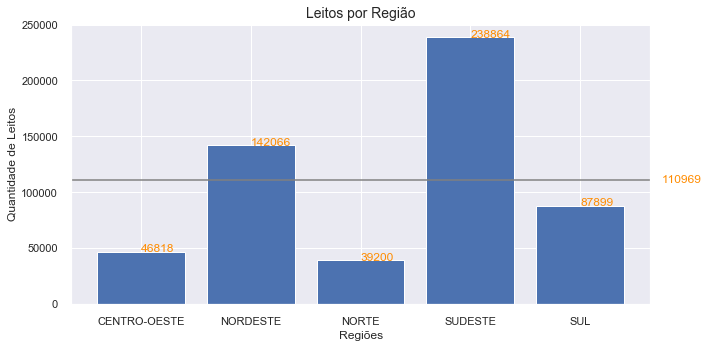

In [11]:
fig = plt.figure(figsize=(10,5))
ax = fig.add_subplot(111)
x = groupby_regioes['NM_REG']
y = groupby_regioes['QT_EXIST_LEITOS_rlEstabComplementar']
plt.title('Leitos por Região',fontsize=14)
plt.xlabel('Regiões',fontsize=12)
plt.ylabel('Quantidade de Leitos',fontsize=12)
ax.bar(x,y)
ax.axhline(110969, color="gray")
ax.text(1.02, 110969, media_leitos_regioes, va='center', ha="left", bbox=dict(facecolor="w",alpha=0.5), color="darkorange",
        transform=ax.get_yaxis_transform(), fontdict=dict(fontsize=12))
for index,data in enumerate(y):
    plt.text(x=index , y =data+1 , s=f"{data}" , fontdict=dict(fontsize=12), color="darkorange")
plt.tight_layout()    
plt.show()

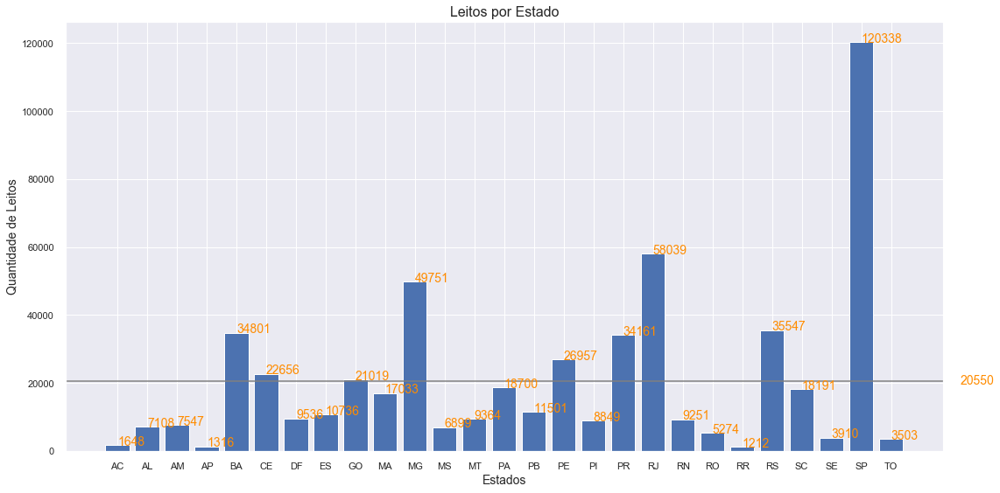

In [12]:
fig = plt.figure(figsize=(16,8))
ax = fig.add_subplot(111)
x = groupby_estados['UF_tbProjPopTCU']
y = groupby_estados['QT_EXIST_LEITOS_rlEstabComplementar']
plt.title('Leitos por Estado',fontsize=16)
plt.xlabel('Estados',fontsize=14)
plt.ylabel('Quantidade de Leitos',fontsize=14)
ax.bar(x,y)
ax.axhline(20550, color="gray")
ax.text(1.02, 20550, media_leitos_estados, va='center', ha="left", bbox=dict(facecolor="w",alpha=0.5), color="darkorange",
        transform=ax.get_yaxis_transform(), fontdict=dict(fontsize=14))
for index,data in enumerate(y):
    plt.text(x=index , y =data+1 , s=f"{data}" , fontdict=dict(fontsize=14), color="darkorange")
plt.tight_layout()    
plt.show()

In [13]:
base_ml = base_full[['COD_MUNIC7_tbProjPopTCU','COD_REG','COD_UF_tbProjPopTCU','COD_MUNIC_tbProjPopTCU',\
                  'POPULACAO_ESTIMADA _tbProjPopTCU','AREA_MUN','DENSIDADE_POP',\
                  'capital_tbMunLatLong','latitude_tbMunLatLong','longitude_tbMunLatLong',\
                  'CENTRAL_DE_ABASTECIMENTO','CENTRAL_DE_GESTAO_EM_SAUDE','CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL',\
                  'CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE','CENTRAL_DE_REGULACAO_DO_ACESSO','CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS',\
                  'CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA','CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA','CENTRO_DE_ATENCAO_PSICOSSOCIAL',\
                  'CENTRO_DE_IMUNIZACAO','CENTRO_DE_PARTO_NORMAL_-_ISOLADO','CENTRO_DE_SAUDE_UNIDADE_BASICA','CLINICA_CENTRO_DE_ESPECIALIDADE',\
                  'CONSULTORIO_ISOLADO','COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE','FARMACIA','HOSPITAL_ESPECIALIZADO',\
                  'HOSPITAL_GERAL','HOSPITAL_DIA_-_ISOLADO','LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN','LABORATORIO_DE_SAUDE_PUBLICA',\
                  'OFICINA_ORTOPEDICA','POLICLINICA','POLO_ACADEMIA_DA_SAUDE','POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE',\
                  'POSTO_DE_SAUDE','PRONTO_ATENDIMENTO','PRONTO_SOCORRO_ESPECIALIZADO','PRONTO_SOCORRO_GERAL',\
                  'SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE','TELESSAUDE','UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO',\
                  'UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA','UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL','UNIDADE_DE_VIGILANCIA_EM_SAUDE',\
                  'UNIDADE_MISTA','UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA','UNIDADE_MOVEL_FLUVIAL','UNIDADE_MOVEL_TERRESTRE',\
                  'QT_UNIDADES_BASICAS','QT_EXIST_LEITOS_rlEstabComplementar']]

### Machine Learning Process

In [14]:
# setting the number of cross validations used in the Model part 
nr_cv = 10

# switch for using log values for SalePrice and features     
use_logvals = 1    
# target used for correlation 
target = 'QT_EXIST_LEITOS_rlEstabComplementar'
    
# only columns with correlation above this threshold value  
min_val_corr = 0.4    
    
# switch for dropping columns that are similar to others already used and show a high correlation to these     
drop_similar = 1

#### Some useful functions

In [15]:
def get_best_score(grid):
    
    best_score = np.sqrt(-grid.best_score_)
    print(best_score)    
    print(grid.best_params_)
    print(grid.best_estimator_)
    
    return best_score

In [16]:
def plot_corr_matrix(df, nr_c, targ) :
    
    corr = df.corr()
    corr_abs = corr.abs()
    cols = corr_abs.nlargest(nr_c, targ)[targ].index
    cm = np.corrcoef(df[cols].values.T)

    plt.figure(figsize=(nr_c/1.5, nr_c/1.5))
    sns.set(font_scale=1.25)
    sns.heatmap(cm, linewidths=1.5, annot=True, square=True, 
                fmt='.2f', annot_kws={'size': 10}, 
                yticklabels=cols.values, xticklabels=cols.values
               )
    plt.show()

#### Load Data

In [17]:
df_train = base_ml.loc[base_ml['QT_EXIST_LEITOS_rlEstabComplementar'] != 0.0]
df_test = base_ml.loc[base_ml['QT_EXIST_LEITOS_rlEstabComplementar'] == 0.0]

#### shape, info, head and describe

In [134]:
print(df_train.shape)
print("*"*50)
print(df_test.shape)

(3706, 51)
**************************************************
(1864, 51)


In [14]:
print(df_train.info())
print("*"*50)
print(df_test.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3706 entries, 0 to 5569
Data columns (total 51 columns):
COD_MUNIC7_tbProjPopTCU                                         3706 non-null int64
COD_REG                                                         3706 non-null int64
COD_UF_tbProjPopTCU                                             3706 non-null int64
COD_MUNIC_tbProjPopTCU                                          3706 non-null int64
POPULACAO_ESTIMADA _tbProjPopTCU                                3706 non-null int64
AREA_MUN                                                        3706 non-null float64
DENSIDADE_POP                                                   3706 non-null float64
capital_tbMunLatLong                                            3706 non-null int64
latitude_tbMunLatLong                                           3706 non-null float64
longitude_tbMunLatLong                                          3706 non-null float64
CENTRAL_DE_ABASTECIMENTO                     

In [15]:
df_train.head()

,COD_MUNIC7_tbProjPopTCU,COD_REG,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,AREA_MUN,DENSIDADE_POP,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
0,1100015,1,11,15,22945,7067.025,3.246769,0,-11.92830,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0,38,51.0
1,1100023,1,11,23,107863,4426.571,24.367168,0,-9.90571,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0,145,317.0
2,1100031,1,11,31,5312,1314.352,4.041535,0,-13.49450,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0,18,9.0
3,1100049,1,11,49,85359,3792.892,22.504991,0,-11.43430,-61.4562,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2,362,469.0
4,1100056,1,11,56,16323,2783.300,5.864621,0,-13.18700,-60.8168,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0,34,42.0


In [16]:
df_train.describe()

,COD_MUNIC7_tbProjPopTCU,COD_REG,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,AREA_MUN,DENSIDADE_POP,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
count,3.706000e+03,3706.000000,3706.000000,3706.000000,3.706000e+03,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000,3706.000000
mean,3.198342e+06,2.837021,31.843497,13992.288451,5.328154e+04,2032.581730,161.021317,0.007285,-15.427735,-46.122688,0.048300,1.152725,0.033729,0.032110,0.304911,0.064490,0.281436,0.123853,0.824339,0.018618,0.008904,9.458176,15.450351,51.314085,0.213977,1.053697,0.337021,1.580950,0.209120,0.008365,0.122504,0.008365,2.694819,0.597140,0.111441,2.542634,0.322450,0.032110,0.110362,0.242580,0.024285,7.549919,0.276039,0.021317,0.725040,0.183216,1.272531,0.021317,0.392876,99.770103,149.715866
std,1.034025e+06,1.134368,10.320207,14378.946726,2.701275e+05,6771.370461,763.266672,0.085055,8.380093,6.773682,0.339228,0.842776,0.244112,0.189594,0.649187,0.267738,0.771185,1.063713,2.132117,0.226286,0.107362,17.251979,116.536990,348.838475,2.671553,4.723511,2.960289,4.839062,1.860806,0.099582,0.442171,0.107406,18.639458,1.688377,0.631382,4.292345,1.191476,0.398099,0.578486,2.665363,0.208985,32.991698,2.237975,0.206059,1.367723,0.439174,5.702966,0.241070,1.332250,543.616950,950.128963
min,1.100015e+06,1.000000,11.000000,13.000000,1.034000e+03,15.331000,0.049349,0.000000,-33.525000,-72.899700,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,1.000000
25%,2.410430e+06,2.000000,24.000000,4103.250000,1.013950e+04,275.225750,12.940563,0.000000,-22.548250,-50.793450,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000

In [17]:
df_test.head()

,COD_MUNIC7_tbProjPopTCU,COD_REG,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,AREA_MUN,DENSIDADE_POP,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
43,1101476,1,11,1476,2856,605.692,4.715268,0,-11.82950,-61.3153,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0.0
55,1200138,1,12,138,10266,3034.869,3.382683,0,-9.81528,-67.9550,0,1,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,9,0.0
56,1200179,1,12,179,11733,1701.974,6.893760,0,-10.56600,-67.6860,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,1,0,1,0,1,10,0.0
58,1200252,1,12,252,18411,1654.768,11.126031,0,-11.01880,-68.7341,0,1,0,0,0,0,0,0,1,0,0,7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,12,0.0
73,1200807,1,12,807,18504,2604.885,7.103577,0,-9.58138,-67.5478,0,1,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,1,0,1,0,2,13,0.0


In [18]:
df_test.describe()

,COD_MUNIC7_tbProjPopTCU,COD_REG,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,AREA_MUN,DENSIDADE_POP,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
count,1.864000e+03,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.0,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.0,1864.000000,1864.0,1864.0,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.000000,1864.0,1864.000000,1864.000000,1864.000000,1864.000000,1864.0
mean,3.363436e+06,3.018777,33.439914,19444.834764,6805.648069,517.733282,38.109658,0.0,-18.479906,-46.446353,0.010193,1.004292,0.006974,0.021459,0.111588,0.001073,0.104614,0.006438,0.072425,0.000536,0.001073,2.626609,0.619635,1.312232,0.0,0.284871,0.0,0.0,0.001073,0.001073,0.048820,0.000536,0.149678,0.383047,0.013948,1.005901,0.088519,0.000536,0.022532,0.006974,0.002146,0.850858,0.094421,0.003219,0.267167,0.0,0.122318,0.000536,0.065987,9.313305,0.0
std,8.690359e+05,0.979210,8.692927,18276.328040,7147.593051,1118.837591,91.454213,0.0,7.709458,5.607955,0.105680,0.163768,0.083243,0.144948,0.321688,0.032747,0.326500,0.103411,0.263368,0.023162,0.032747,2.116839,1.225363,3.305543,0.0,0.609345,0.0,0.0,0.032747,0.032747,0.241392,0.023162,0.470972,0.552409,0.134371,1.757269,0.295243,0.023162,0.152019,0.089459,0.046287,1.299188,1.947428,0.065451,0.499571,0.0,0.364936,0.023162,0.258908,7.697482,0.0
min,1.101476e+06,1.000000,11.000000,27.000000,781.000000,3.565000,0.277225,0.0,-33.686600,-68.734100,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,1.000000,0.0
25%,2.807476e+06,2.000000,28.000000,5507.750000,3153.000000,135.212250,10.347906,0.0,-24.009975,-51.077950,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,5.000000,0.0
50%,3.166352e+06,3.000000,31.000000,13179.500000,4895.000000,237.757000,19.937185,0.0,-20.281300,-47.451550,0.000000,1.000000,0.000000,0.000000,0.000000,0.0

#### The target variable : Distribution

Skewness: 26.992686
Kurtosis: 936.121606


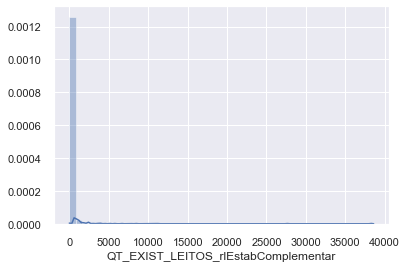

In [19]:
sns.distplot(df_train['QT_EXIST_LEITOS_rlEstabComplementar']);
#skewness and kurtosis
print("Skewness: %f" % df_train['QT_EXIST_LEITOS_rlEstabComplementar'].skew())
print("Kurtosis: %f" % df_train['QT_EXIST_LEITOS_rlEstabComplementar'].kurt())

Como vemos, a variável de destino QT_EXIST_LEITOS_rlEstabComplementar normalmente não é distribuída.
Isso pode reduzir o desempenho dos modelos de regressão ML, porque alguns assumem distribuição normal.
Portanto, fazemos uma transformação de log, a distribuição resultante parece muito melhor.

Skewness: 0.822995
Kurtosis: 2.263616


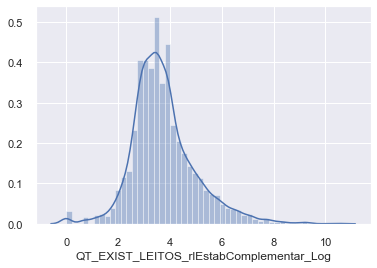

In [20]:
df_train['QT_EXIST_LEITOS_rlEstabComplementar_Log'] = np.log(df_train['QT_EXIST_LEITOS_rlEstabComplementar'])

sns.distplot(df_train['QT_EXIST_LEITOS_rlEstabComplementar_Log']);
# skewness and kurtosis
print("Skewness: %f" % df_train['QT_EXIST_LEITOS_rlEstabComplementar_Log'].skew())
print("Kurtosis: %f" % df_train['QT_EXIST_LEITOS_rlEstabComplementar_Log'].kurt())
# dropping old column
df_train.drop('QT_EXIST_LEITOS_rlEstabComplementar', axis= 1, inplace=True)

#### List of features with missing values 

In [21]:
total = df_train.isnull().sum().sort_values(ascending=False)
percent = (df_train.isnull().sum()/df_train.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(60)

,Total,Percent
QT_EXIST_LEITOS_rlEstabComplementar_Log,0,0.0
CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,0,0.0
CLINICA_CENTRO_DE_ESPECIALIDADE,0,0.0
CENTRO_DE_SAUDE_UNIDADE_BASICA,0,0.0
CENTRO_DE_PARTO_NORMAL_-_ISOLADO,0,0.0
CENTRO_DE_IMUNIZACAO,0,0.0
CENTRO_DE_ATENCAO_PSICOSSOCIAL,0,0.0
CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,0,0.0
CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,0,0.0
CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,0,0.0


In [23]:
total = df_train.isnull().sum().sort_values(ascending=False)
percent = (df_train.isnull().sum()/df_train.isnull().count()).sort_values(ascending=False)
missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_data.head(60)

,Total,Percent
QT_EXIST_LEITOS_rlEstabComplementar_Log,0,0.0
CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,0,0.0
CLINICA_CENTRO_DE_ESPECIALIDADE,0,0.0
CENTRO_DE_SAUDE_UNIDADE_BASICA,0,0.0
CENTRO_DE_PARTO_NORMAL_-_ISOLADO,0,0.0
CENTRO_DE_IMUNIZACAO,0,0.0
CENTRO_DE_ATENCAO_PSICOSSOCIAL,0,0.0
CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,0,0.0
CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,0,0.0
CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,0,0.0


#### log transform 

Como a variável de destino, também alguns dos valores dos recursos não são normalmente distribuídos e, portanto, é melhor usar valores de log em df_train e df_test. Verificando a assimetria e curtose:

Skewness: 30.673727
Kurtosis: 1236.310894


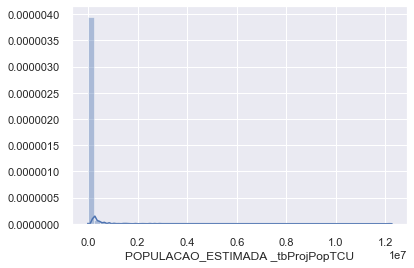

In [24]:
sns.distplot(df_train['POPULACAO_ESTIMADA _tbProjPopTCU']);
#skewness and kurtosis
print("Skewness: %f" % df_train['POPULACAO_ESTIMADA _tbProjPopTCU'].skew())
print("Kurtosis: %f" % df_train['POPULACAO_ESTIMADA _tbProjPopTCU'].kurt())

Skewness: 11.269043
Kurtosis: 174.480561


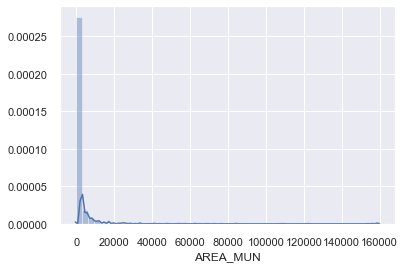

In [25]:
sns.distplot(df_train['AREA_MUN']);
#skewness and kurtosis
print("Skewness: %f" % df_train['AREA_MUN'].skew())
print("Kurtosis: %f" % df_train['AREA_MUN'].kurt())

Skewness: 10.971396
Kurtosis: 148.269988


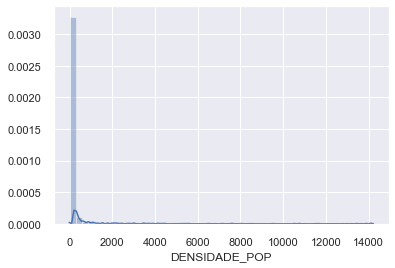

In [26]:
sns.distplot(df_train['DENSIDADE_POP']);
#skewness and kurtosis
print("Skewness: %f" % df_train['DENSIDADE_POP'].skew())
print("Kurtosis: %f" % df_train['DENSIDADE_POP'].kurt())

In [27]:
for df in [df_train, df_test]:
    df['POPULACAO_ESTIMADA _tbProjPopTCU_Log'] = np.log(df['POPULACAO_ESTIMADA _tbProjPopTCU'])
    df.drop('POPULACAO_ESTIMADA _tbProjPopTCU', inplace= True, axis = 1)
    df['AREA_MUN_Log'] = np.log(df['AREA_MUN'])
    df.drop('AREA_MUN', inplace= True, axis = 1)
    df['DENSIDADE_POP_Log'] = np.log(df['DENSIDADE_POP'])
    df.drop('DENSIDADE_POP', inplace= True, axis = 1)

Skewness: 0.846837
Kurtosis: 1.532454


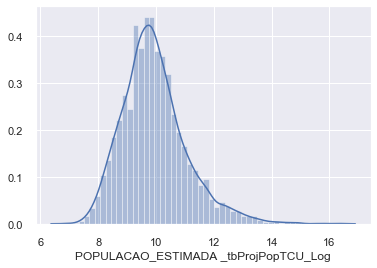

In [28]:
sns.distplot(df_train['POPULACAO_ESTIMADA _tbProjPopTCU_Log']);
#skewness and kurtosis
print("Skewness: %f" % df_train['POPULACAO_ESTIMADA _tbProjPopTCU_Log'].skew())
print("Kurtosis: %f" % df_train['POPULACAO_ESTIMADA _tbProjPopTCU_Log'].kurt())

Skewness: 0.660222
Kurtosis: 0.743933


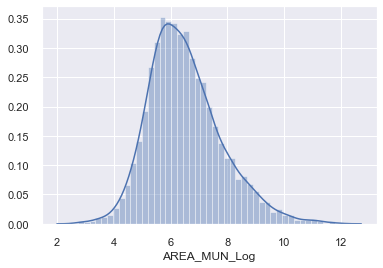

In [29]:
sns.distplot(df_train['AREA_MUN_Log']);
#skewness and kurtosis
print("Skewness: %f" % df_train['AREA_MUN_Log'].skew())
print("Kurtosis: %f" % df_train['AREA_MUN_Log'].kurt())

Skewness: 0.352820
Kurtosis: 1.344668


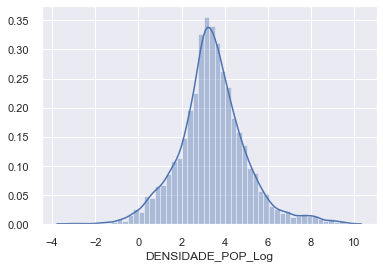

In [30]:
sns.distplot(df_train['DENSIDADE_POP_Log']);
#skewness and kurtosis
print("Skewness: %f" % df_train['DENSIDADE_POP_Log'].skew())
print("Kurtosis: %f" % df_train['DENSIDADE_POP_Log'].kurt())

In [33]:
df_train[df_train.columns[1:-1]].apply(lambda x: x.corr(df_train['QT_EXIST_LEITOS_rlEstabComplementar_Log']))

COD_REG                                                         0.084295
COD_UF_tbProjPopTCU                                             0.089727
COD_MUNIC_tbProjPopTCU                                          0.084627
capital_tbMunLatLong                                            0.324449
latitude_tbMunLatLong                                          -0.205806
longitude_tbMunLatLong                                         -0.073544
CENTRAL_DE_ABASTECIMENTO                                        0.266524
CENTRAL_DE_GESTAO_EM_SAUDE                                      0.413436
CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL    0.306840
CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE                       0.114361
CENTRAL_DE_REGULACAO_DO_ACESSO                                  0.457910
CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS                       0.500692
CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA                              0.070649
CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA    

In [135]:
df_train

,COD_MUNIC7_tbProjPopTCU,COD_REG,COD_UF_tbProjPopTCU,COD_MUNIC_tbProjPopTCU,POPULACAO_ESTIMADA _tbProjPopTCU,AREA_MUN,DENSIDADE_POP,capital_tbMunLatLong,latitude_tbMunLatLong,longitude_tbMunLatLong,CENTRAL_DE_ABASTECIMENTO,CENTRAL_DE_GESTAO_EM_SAUDE,CENTRAL_DE_NOTIFICACAO_CAPTACAO_E_DISTRIB_DE_ORGAOS_ESTADUAL,CENTRAL_DE_REGULACAO_DE_SERVICOS_DE_SAUDE,CENTRAL_DE_REGULACAO_DO_ACESSO,CENTRAL_DE_REGULACAO_MEDICA_DAS_URGENCIAS,CENTRO_DE_APOIO_A_SAUDE_DA_FAMILIA,CENTRO_DE_ATENCAO_HEMOTERAPIA_E_OU_HEMATOLOGICA,CENTRO_DE_ATENCAO_PSICOSSOCIAL,CENTRO_DE_IMUNIZACAO,CENTRO_DE_PARTO_NORMAL_-_ISOLADO,CENTRO_DE_SAUDE_UNIDADE_BASICA,CLINICA_CENTRO_DE_ESPECIALIDADE,CONSULTORIO_ISOLADO,COOPERATIVA_OU_EMPRESA_DE_CESSAO_DE_TRABALHADORES_NA_SAUDE,FARMACIA,HOSPITAL_ESPECIALIZADO,HOSPITAL_GERAL,HOSPITAL_DIA_-_ISOLADO,LABORATORIO_CENTRAL_DE_SAUDE_PUBLICA_LACEN,LABORATORIO_DE_SAUDE_PUBLICA,OFICINA_ORTOPEDICA,POLICLINICA,POLO_ACADEMIA_DA_SAUDE,POLO_DE_PREVENCAO_DE_DOENCAS_E_AGRAVOS_E_PROMOCAO_DA_SAUDE,POSTO_DE_SAUDE,PRONTO_ATENDIMENTO,PRONTO_SOCORRO_ESPECIALIZADO,PRONTO_SOCORRO_GERAL,SERVICO_DE_ATENCAO_DOMICILIAR_ISOLADO_HOMECARE,TELESSAUDE,UNIDADE_DE_APOIO_DIAGNOSE_E_TERAPIA_ISOLADO,UNIDADE_DE_ATENCAO_A_SAUDE_INDIGENA,UNIDADE_DE_ATENCAO_EM_REGIME_RESIDENCIAL,UNIDADE_DE_VIGILANCIA_EM_SAUDE,UNIDADE_MISTA,UNIDADE_MOVEL_DE_NIVEL_PREHOSPITALAR_NA_AREA_DE_URGENCIA,UNIDADE_MOVEL_FLUVIAL,UNIDADE_MOVEL_TERRESTRE,QT_UNIDADES_BASICAS,QT_EXIST_LEITOS_rlEstabComplementar
0,1100015,1,11,15,22945,7067.025,3.246769,0,-11.92830,-61.9953,0,1,0,0,0,0,0,1,1,0,0,4,1,7,0,1,0,2,0,0,0,0,0,1,0,6,0,0,0,0,0,5,7,0,1,0,0,0,0,38,51.0
1,1100023,1,11,23,107863,4426.571,24.367168,0,-9.90571,-63.0325,0,3,0,0,1,1,2,1,1,0,1,13,42,36,0,2,1,9,0,0,0,0,1,0,0,0,1,0,0,1,0,16,0,0,5,0,8,0,0,145,317.0
2,1100031,1,11,31,5312,1314.352,4.041535,0,-13.49450,-60.5520,0,1,0,0,0,0,1,0,0,0,0,3,0,3,0,1,0,0,0,0,1,0,0,1,0,5,0,0,0,0,0,0,0,0,1,1,0,0,0,18,9.0
3,1100049,1,11,49,85359,3792.892,22.504991,0,-11.43430,-61.4562,0,2,0,0,0,0,0,1,1,0,0,12,42,207,0,42,0,9,0,0,0,0,5,0,0,1,0,0,1,2,0,18,15,0,2,0,0,0,2,362,469.0
4,1100056,1,11,56,16323,2783.300,5.864621,0,-13.18700,-60.8168,0,1,0,0,0,0,0,0,1,0,0,5,4,9,0,6,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,4,0,0,1,0,0,0,0,34,42.0
5,1100064,1,11,64,15882,1451.060,10.945102,0,-13.11740,-60.5454,0,1,0,0,0,0,0,0,1,0,0,4,2,6,0,1,0,1,0,0,0,0,0,0,0,2,0,0,0,0,0,3,0,0,1,0,0,0,0,22,50.0
6,1100072,1,11,72,7391,3060.321,2.415106,0,-12.95510,-60.8947,0,1,0,0,0,0,0,2,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,4,0,0,0,0,0,0,1,0,2,1,0,0,0,13,16.0
7,1100080,1,11,80,18331,4987.177,3.675627,0,-12.43670,-64.2280,0,1,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0,0,0,0,0,4,0,0,1,1,0,0,0,15,45.0
8,1100098,1,11,98,32374,4518.027,7.165517,0,-11.52660,-61.0252,0,1,0,0,0,0,0,1,1,0,0,2,6,13,0,0,0,3,0,0,0,0,0,0,0,9,0,0,0,0,0,5,6,0,2,0,0,0,0,49,55.0
9,1100106,1,11,106,46174,24855.724,1.857681,0,-10.78890,-65.3296,0,1,0,0,0,0,0,1,1,0,0,7,0,15,0,0,0,2,0,1,0,0,0,0,1,12,0,0,0,0,0,9,5,0,2,0,0,0,3,60,97.0


In [37]:
corr = df_train.corr()
corr.style.background_gradient(cmap='coolwarm')

In [136]:
y = df_train['QT_EXIST_LEITOS_rlEstabComplementar']
X = df_train.drop('QT_EXIST_LEITOS_rlEstabComplementar', axis=1)

In [137]:
from sklearn.model_selection import GridSearchCV
score_calc = 'neg_mean_squared_error'

#### Linear Regression 

In [12]:
from sklearn.linear_model import LinearRegression

linreg = LinearRegression()
parameters = {'fit_intercept':[True,False], 'normalize':[True,False], 'copy_X':[True, False]}
grid_linear = GridSearchCV(linreg, parameters, cv=nr_cv, verbose=1 , scoring = score_calc)
grid_linear.fit(X, y)

sc_linear = get_best_score(grid_linear)

Fitting 10 folds for each of 8 candidates, totalling 80 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


158.48477707517364
{'copy_X': True, 'fit_intercept': False, 'normalize': True}
LinearRegression(copy_X=True, fit_intercept=False, n_jobs=None, normalize=True)


[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed:    0.7s finished
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


#### Ridge 

In [13]:
from sklearn.linear_model import Ridge

ridge = Ridge()
parameters = {'alpha':[0.001,0.005,0.01,0.1,0.5,1], 'normalize':[True,False], 'tol':[1e-06,5e-06,1e-05,5e-05]}
grid_ridge = GridSearchCV(ridge, parameters, cv=nr_cv, verbose=1, scoring = score_calc)
grid_ridge.fit(X, y)

sc_ridge = get_best_score(grid_ridge)

Fitting 10 folds for each of 48 candidates, totalling 480 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=3.6487e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=2.81743e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=2.68391e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=2.57264e-19): result may not be accurate.
  overwrite_a=True).T
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=2.52407e-19): result may not be accurate.
  overw

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=1.27045e-18): result may not be accurate.
  overwrite_a=True).T
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=1.36386e-18): result may not be accurate.
  overwrite_a=True).T
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=1.42527e-18): result may not be accurate.
  overwrite_a=True).T
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=2.03777e-18): result may not be accurate.
  overwrite_a=True).T
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=1.82428e-18): result may not be accurate.
  overwrite_a=True).T
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\r

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=3.64461e-17): result may not be accurate.
  overwrite_a=True).T
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=2.81535e-17): result may not be accurate.
  overwrite_a=True).T
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=2.68213e-17): result may not be accurate.
  overwrite_a=True).T
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=2.57047e-17): result may not be accurate.
  overwrite_a=True).T
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\ridge.py:147: LinAlgWarning: Ill-conditioned matrix (rcond=2.52246e-17): result may not be accurate.
  overwrite_a=True).T
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\r

158.58818914233177
{'alpha': 1, 'normalize': False, 'tol': 1e-06}
Ridge(alpha=1, copy_X=True, fit_intercept=True, max_iter=None, normalize=False,
      random_state=None, solver='auto', tol=1e-06)


[Parallel(n_jobs=1)]: Done 480 out of 480 | elapsed:    3.6s finished
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


#### Lasso

In [14]:
from sklearn.linear_model import Lasso

lasso = Lasso()
parameters = {'alpha':[1e-03,0.01,0.1,0.5,0.8,1], 'normalize':[True,False], 'tol':[1e-06,1e-05,5e-05,1e-04,5e-04,1e-03]}
grid_lasso = GridSearchCV(lasso, parameters, cv=nr_cv, verbose=1, scoring = score_calc)
grid_lasso.fit(X, y)

sc_lasso = get_best_score(grid_lasso)

Fitting 10 folds for each of 72 candidates, totalling 720 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9880808.73725336, tolerance: 3273.444623815893
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9036642.10350662, tolerance: 3194.7666151766107
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9799373.869060075, tolerance: 3302.8222187148426
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9036642.10350662, tolerance: 319476.6615176611
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 9799373.869060075, tolerance: 330282.2218714843
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 8447909.016202021, tolerance: 318979.08001721126
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19916893.503396362, tolerance: 3302.8222187148426
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17421981.177809615, tolerance: 3189.7908001721125
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20014847.90096953, tolerance: 3112.2770594872577
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality 

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17421981.177809615, tolerance: 318979.08001721126
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20014847.90096953, tolerance: 311227.7059487258
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16879320.143808767, tolerance: 329459.2020433582
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality ga

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 83591.54583530128, tolerance: 3112.2770594872577
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 849141.0134055018, tolerance: 3294.5920204335816
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 396068.0845279284, tolerance: 3276.4205521426848
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality ga

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19837664.786647294, tolerance: 32734.446238158933
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18157613.425674815, tolerance: 31947.666151766112
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19943632.706120446, tolerance: 33028.22218714843
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality 

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18157613.425674815, tolerance: 1597383.3075883056
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 19943632.706120446, tolerance: 1651411.1093574215
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17441944.527856465, tolerance: 1594895.4000860562
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16045241.36125597, tolerance: 33028.22218714843
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12875568.489127168, tolerance: 31897.908001721127
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20291703.40410469, tolerance: 31122.77059487258
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12875568.489127168, tolerance: 1594895.4000860562
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 20291703.40410469, tolerance: 1556138.529743629
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17187150.491301693, tolerance: 1647296.010216791
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality ga

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15424865.562557548, tolerance: 31122.77059487258
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12874491.810478985, tolerance: 32945.920204335824
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11779849.619085332, tolerance: 10264.494095584536
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality 

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 12874491.810478985, tolerance: 1647296.010216791
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 11779849.619085332, tolerance: 513224.70477922674
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15779833.358416516, tolerance: 1638210.2760713424
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality 

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 14556898.991443913, tolerance: 31122.77059487258
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13203431.897444371, tolerance: 32945.920204335824
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15302685.878960311, tolerance: 10264.494095584536
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality 

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13203431.897444371, tolerance: 1647296.010216791
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15302685.878960311, tolerance: 513224.70477922674
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15158695.166209597, tolerance: 1638210.2760713424
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality 

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 15912510.634235626, tolerance: 33028.22218714843
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13204590.067511007, tolerance: 31897.908001721127
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17348843.422713153, tolerance: 31122.77059487258
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality g

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 13204590.067511007, tolerance: 1594895.4000860562
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 17348843.422713153, tolerance: 1556138.529743629
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16074485.025868846, tolerance: 1647296.010216791
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality g

151.88933940354255
{'alpha': 1, 'normalize': False, 'tol': 1e-06}
Lasso(alpha=1, copy_X=True, fit_intercept=True, max_iter=1000, normalize=False,
      positive=False, precompute=False, random_state=None, selection='cyclic',
      tol=1e-06, warm_start=False)


C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 16457569.089040682, tolerance: 3344.67039380707
  positive)


#### Elastic Net

In [32]:
from sklearn.linear_model import ElasticNet

enet = ElasticNet()
parameters = {'alpha' :[0.1,1.0,10], 'max_iter' :[10000], 'l1_ratio':[0.04,0.05], 
              'fit_intercept' : [False,True], 'normalize':[True,False], 'tol':[1e-02,1e-03,1e-04]}
grid_enet = GridSearchCV(enet, parameters, cv=nr_cv, verbose=1, scoring = score_calc)
grid_enet.fit(X, y)

sc_enet = get_best_score(grid_enet)

Fitting 10 folds for each of 72 candidates, totalling 720 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18928014.740410455, tolerance: 10747596.33
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22810520.52123311, tolerance: 3352373.4050000003
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21436148.006957147, tolerance: 3274335.742
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not conv

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22810520.52123311, tolerance: 335237.3405
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21436148.006957147, tolerance: 327433.57420000003
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22780489.25047154, tolerance: 338569.5553
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18873086.2

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22794116.735723518, tolerance: 3352373.4050000003
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21417266.01217636, tolerance: 3274335.742
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22764259.632596288, tolerance: 3385695.553
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18863649.

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 21373421.04756745, tolerance: 319476.6615176611
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 22716463.633876234, tolerance: 330282.2218714843
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 18853065.916397497, tolerance: 318979.08001721126
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality ga

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29909181.98695682, tolerance: 3352373.4050000003
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29454430.60122852, tolerance: 3274335.742
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29969893.183737345, tolerance: 3385695.553
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23669275.1

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29454430.60122852, tolerance: 327433.57420000003
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29969893.183737345, tolerance: 338569.5553
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23669275.180822477, tolerance: 326797.277
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29332876.3

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29404238.543672252, tolerance: 3274335.742
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29923725.534148347, tolerance: 3385695.553
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23636984.543345172, tolerance: 3267972.77
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29289765.7381059

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29934864.414436966, tolerance: 330282.2218714843
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 23647285.205223173, tolerance: 318979.08001721126
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 29287389.59298478, tolerance: 311227.7059487258
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality ga

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 42634479.08652259, tolerance: 33856955.53
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32996254.514443025, tolerance: 32679727.7
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 41244182.513431184, tolerance: 31890874.09
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 38698273.97423982

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 37917575.14374553, tolerance: 33352198.18
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 41180666.33066837, tolerance: 32471064.29
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 43083359.34791035, tolerance: 3352373.4050000003
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 42917010.26

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32695224.775917925, tolerance: 3267972.77
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 40934417.140579656, tolerance: 3189087.409
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 38363108.588127635, tolerance: 3369541.946
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 40255546.9962631

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 40999920.64602737, tolerance: 3247106.429
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 42879134.9568051, tolerance: 335237.3405
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 42414518.05808878, tolerance: 327433.57420000003
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 42298664.922

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 32831563.68909604, tolerance: 318979.08001721126
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 41060441.211755686, tolerance: 311227.7059487258
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 38510636.42337694, tolerance: 329459.2020433582
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap

C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 37270018.89411696, tolerance: 325824.2730919665
  positive)
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 39960721.06151361, tolerance: 316990.1013831834
  positive)
[Parallel(n_jobs=1)]: Done 720 out of 720 | elapsed: 18.8min finished
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


144.06768147893501
{'alpha': 1.0, 'fit_intercept': False, 'l1_ratio': 0.05, 'max_iter': 10000, 'normalize': True, 'tol': 0.001}
ElasticNet(alpha=1.0, copy_X=True, fit_intercept=False, l1_ratio=0.05,
           max_iter=10000, normalize=True, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.001, warm_start=False)


C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\linear_model\coordinate_descent.py:475: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations. Duality gap: 31213826.278895296, tolerance: 3427739.793
  positive)


#### SGDRegressor

In [141]:
from sklearn.linear_model import SGDRegressor

sgd = SGDRegressor()
parameters = {'max_iter' :[100000], 'alpha':[1e-05], 'epsilon':[1e-02], 'fit_intercept' : [True]  }
grid_sgd = GridSearchCV(sgd, parameters, cv=nr_cv, verbose=1, scoring = score_calc)
grid_sgd.fit(X, y)

sc_sgd = get_best_score(grid_sgd)

Fitting 10 folds for each of 1 candidates, totalling 10 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


2.640521372854656e+21
{'alpha': 1e-05, 'epsilon': 0.01, 'fit_intercept': True, 'max_iter': 100000}
SGDRegressor(alpha=1e-05, average=False, early_stopping=False, epsilon=0.01,
             eta0=0.01, fit_intercept=True, l1_ratio=0.15,
             learning_rate='invscaling', loss='squared_loss', max_iter=100000,
             n_iter_no_change=5, penalty='l2', power_t=0.25, random_state=None,
             shuffle=True, tol=0.001, validation_fraction=0.1, verbose=0,
             warm_start=False)


[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.1s finished


#### DecisionTreeRegressor

In [16]:
from sklearn.tree import DecisionTreeRegressor

param_grid = { 'max_depth' : [7,8,9,10] , 'max_features' : [11,12,13,14] ,
               'max_leaf_nodes' : [None, 12,15,18,20] ,'min_samples_split' : [20,25,30],
                'presort': [False,True] , 'random_state': [5] }
            
grid_dtree = GridSearchCV(DecisionTreeRegressor(), param_grid, cv=nr_cv, refit=True, verbose=1, scoring = score_calc)
grid_dtree.fit(X, y)

sc_dtree = get_best_score(grid_dtree)

Fitting 10 folds for each of 480 candidates, totalling 4800 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


638.9218500064449
{'max_depth': 10, 'max_features': 14, 'max_leaf_nodes': None, 'min_samples_split': 30, 'presort': False, 'random_state': 5}
DecisionTreeRegressor(criterion='mse', max_depth=10, max_features=14,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=30, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=5, splitter='best')


[Parallel(n_jobs=1)]: Done 4800 out of 4800 | elapsed:  1.0min finished
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


#### RandomForestRegressor

In [17]:
from sklearn.ensemble import RandomForestRegressor

param_grid = {'min_samples_split' : [3,4,6,10], 'n_estimators' : [70,100], 'random_state': [5] }
grid_rf = GridSearchCV(RandomForestRegressor(), param_grid, cv=nr_cv, refit=True, verbose=1, scoring = score_calc)
grid_rf.fit(X, y)

sc_rf = get_best_score(grid_rf)

Fitting 10 folds for each of 8 candidates, totalling 80 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed:  4.5min finished
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


576.3046124841994
{'min_samples_split': 6, 'n_estimators': 100, 'random_state': 5}
RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=None,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=6,
                      min_weight_fraction_leaf=0.0, n_estimators=100,
                      n_jobs=None, oob_score=False, random_state=5, verbose=0,
                      warm_start=False)


#### KNN Regressor

In [18]:
from sklearn.neighbors import KNeighborsRegressor

param_grid = {'n_neighbors' : [3,4,5,6,7,10,15] ,    
              'weights' : ['uniform','distance'] ,
              'algorithm' : ['ball_tree', 'kd_tree', 'brute']}

grid_knn = GridSearchCV(KNeighborsRegressor(), param_grid, cv=nr_cv, refit=True, verbose=1, scoring = score_calc)
grid_knn.fit(X, y)

sc_knn = get_best_score(grid_knn)

Fitting 10 folds for each of 42 candidates, totalling 420 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


588.9345850698368
{'algorithm': 'brute', 'n_neighbors': 4, 'weights': 'distance'}
KNeighborsRegressor(algorithm='brute', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=4, p=2,
                    weights='distance')


[Parallel(n_jobs=1)]: Done 420 out of 420 | elapsed:   11.4s finished
C:\Users\bruno\Anaconda3\lib\site-packages\sklearn\model_selection\_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


#### Comparison plot: RMSE of all models

In [143]:
list_scores = [sc_linear, sc_ridge, sc_lasso, sc_enet,
               sc_sgd, sc_dtree, sc_rf, sc_knn]
list_regressors = ['Linear','Ridge','Lasso','ElaNet','SGD','DTr','RF','KNN']

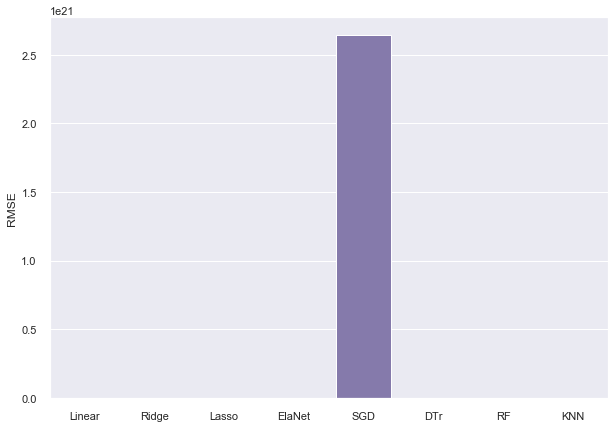

In [145]:
fig, ax = plt.subplots()
fig.set_size_inches(10,7)
sns.barplot(x=list_regressors, y=list_scores)
plt.ylabel('RMSE')
plt.show()